# **PJ experimenting**

| **Pipeline Steps**                                              | **Script files**                          |
|-----------------------------------------------------------|-------------------------------------------|
| 1) Read and pre-process data                              | pre_processing.py                         |
| 2) Feature engineering                                    | feature_engineering.py                    |
| 3) Train models                                           | model_training.py, <br>tree_model_training.py |
| 4) Predict on test_features <br>and write submission file | final_predict.py                          |

## Introduction 

Overall strategy and tools utilised

In [1]:
#Imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
import scripts.pre_processing as pp
import scripts.feature_engineering as fe
import scripts.tree_model_training as tm
import scripts.linear_model_training as lm
from scripts.model_evaluation import regression_evaluation
import scripts.final_predict as fp
import scripts.data_viz as dv
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler

# PIPELINE

## 1) Pre-process data

In [2]:
# Read in data files 
train_features = pd.read_csv('./data/dengue_features_train.csv')
train_target = pd.read_csv('./data/dengue_labels_train.csv')
test_features = pd.read_csv('./data/dengue_features_test.csv')

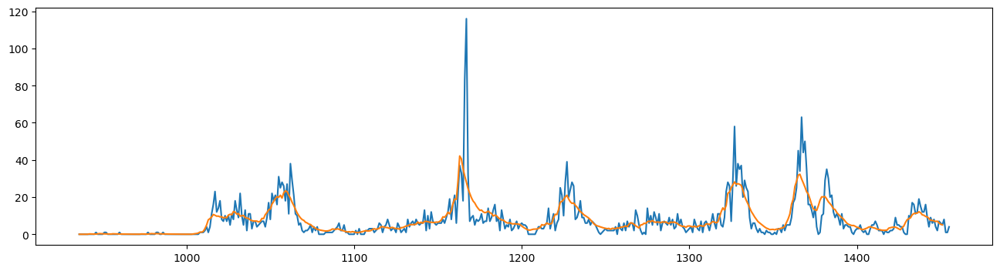

In [3]:
# Plot output 
plt.figure(figsize=(16,4))
plt.plot(train_target.loc[train_target.city == 'iq', 'total_cases'])
plt.plot(train_target.loc[train_target.city == 'iq', 'total_cases'].ewm(span=12).mean().shift(-4))

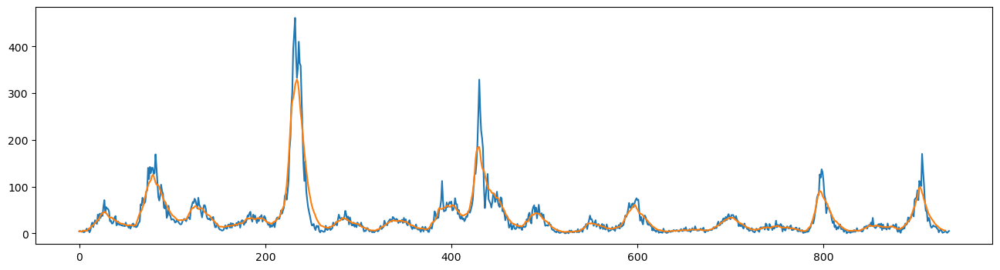

In [4]:
# Plot output 
plt.figure(figsize=(16,4))
plt.plot(train_target.loc[train_target.city == 'sj', 'total_cases'])
plt.plot(train_target.loc[train_target.city == 'sj', 'total_cases'].ewm(span=12).mean().shift(-4))

In [5]:
# Merge features and target data
data = pp.merge_data(train_features, train_target, test_features, inc_test=False)

# Run processing and split by city
Xy_iq = pp.pre_process(data, 'iq', remove_anomalies=True, inc_test=False, smooth_y=True)
Xy_sj = pp.pre_process(data, 'sj', remove_anomalies=True, inc_test=False, smooth_y=True)

print(f'Xy_iq shape: {Xy_iq.shape}') 
print(f'Xy_sj shape: {Xy_sj.shape}') 

Xy_iq shape: (444, 24)
Xy_sj shape: (928, 24)


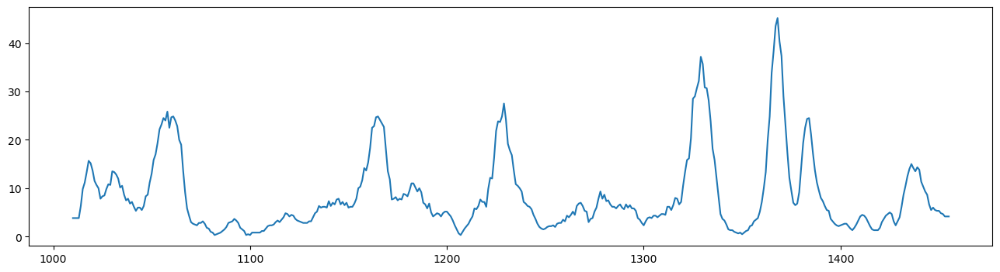

In [6]:
plt.figure(figsize=(16,4))
plt.plot(Xy_iq.total_cases)

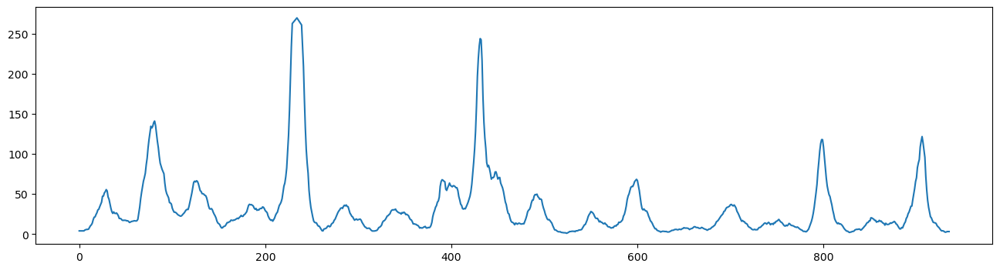

In [7]:
plt.figure(figsize=(16,4))
plt.plot(Xy_sj.total_cases)


## 2) Feature engineering

In [8]:
# Run feature engineering 
Xy_iq = fe.add_seasonality_factors(Xy_iq, city='iq')
Xy_sj = fe.add_seasonality_factors(Xy_sj, city='sj')
##Xy_iq = fe.cyclical_encode_date(Xy_iq)
##Xy_sj = fe.cyclical_encode_date(Xy_sj)
##Xy_iq = fe.shift_features(Xy_iq, periods=1)
##Xy_sj = fe.shift_features(Xy_sj, periods=1)
Xy_iq = fe.drop_date(Xy_iq)
Xy_sj = fe.drop_date(Xy_sj)
Xy_iq = fe.add_rolling(Xy_iq, 'iq', fillna=False)
Xy_sj = fe.add_rolling(Xy_sj, 'sj', fillna=False)
Xy_iq = fe.add_rolling_3(Xy_iq, 'iq')
Xy_sj = fe.add_rolling_3(Xy_sj, 'sj')

print(f'train_iq shape: {Xy_iq.shape}') 
print(f'train_sj shape: {Xy_sj.shape}') 

train_iq shape: (421, 74)
train_sj shape: (905, 74)


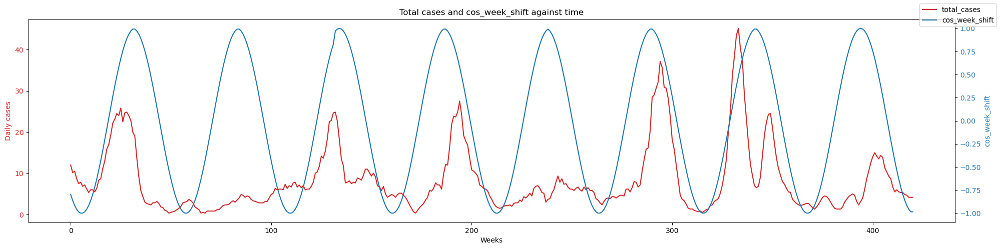

In [9]:
## Fit cosine wave better to data

Xy_iq['cos_week_shift'] = Xy_iq['cos_week'].shift(-1)
Xy_iq['cos_week_shift'] = Xy_iq['cos_week_shift'].fillna(method='ffill')

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'cos_week_shift'
dv.feature_output_chart(data, y, feature, city='iq')



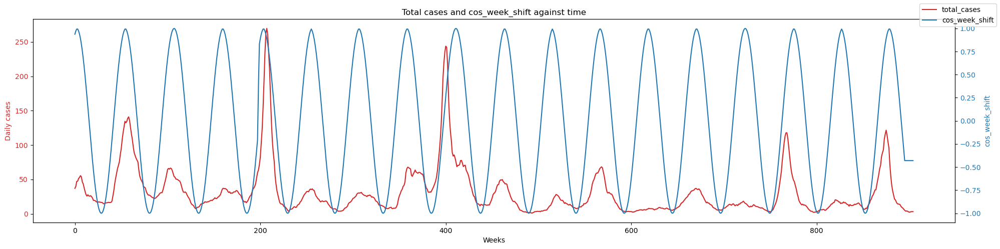

In [10]:
## Fit cosine wave better to data
Xy_sj['cos_week_shift'] = Xy_sj['cos_week'].shift(-9)
Xy_sj['cos_week_shift'] = Xy_sj['cos_week_shift'].fillna(method='ffill')

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'cos_week_shift'
dv.feature_output_chart(data, y, feature, city='sj')

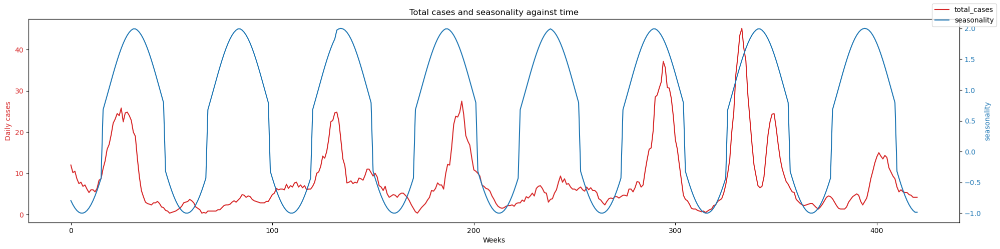

In [11]:
# Combine cosine and part of year to create a seasonality feature 
Xy_iq['seasonality'] = (Xy_iq['cos_week_shift'] + Xy_iq['part_of_year'])

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'seasonality'
dv.feature_output_chart(data, y, feature, city='iq')

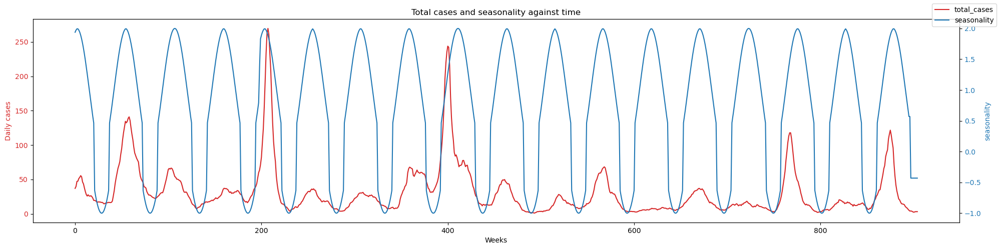

In [12]:
# Combine cosine and part of year to create a seasonality feature 
Xy_sj['seasonality'] = (Xy_sj['cos_week_shift'] + Xy_sj['part_of_year'])

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'seasonality'
dv.feature_output_chart(data, y, feature, city='sj')

## Feature engineering experimentation 

<Axes: >

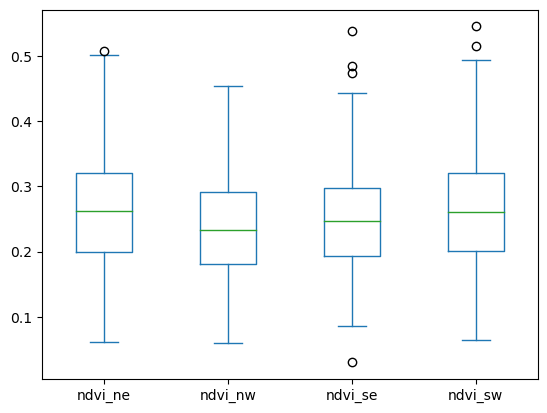

In [13]:
Xy_iq.loc[:,['ndvi_ne','ndvi_nw','ndvi_se','ndvi_sw']].plot(kind='box')

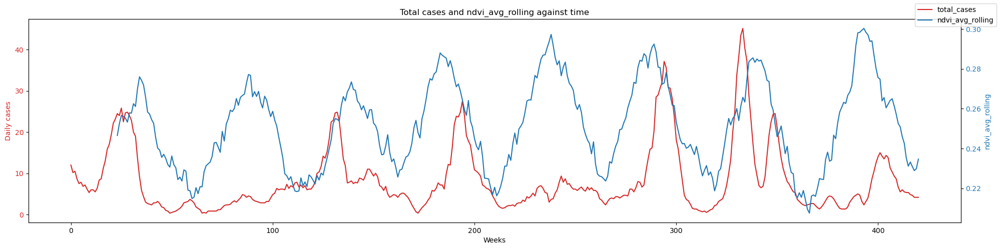

In [14]:
# Vegetation 
#add ndvi all
Xy_iq['ndvi_avg'] = Xy_iq.loc[:,['ndvi_nw','ndvi_se','ndvi_sw']].mean(axis=1)  # Trying with ndvi_ne remove as lots of missing values 
#Xy_iq['ndvi_all_rolling'] = Xy_iq['ndvi_all'].rolling(24, center=False).mean()
#Xy_iq['ndvi_all_ewm'] = Xy_iq['ndvi_all'].ewm(span=16).mean()
#Xy_iq['ndvi_all_ewm_shift'] = Xy_iq['ndvi_all_ewm'].shift(10)
Xy_iq['ndvi_avg_rolling'] = Xy_iq['ndvi_avg'].rolling(24, center=False).mean()

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'ndvi_avg_rolling'
dv.feature_output_chart(data, y, feature, city='iq')

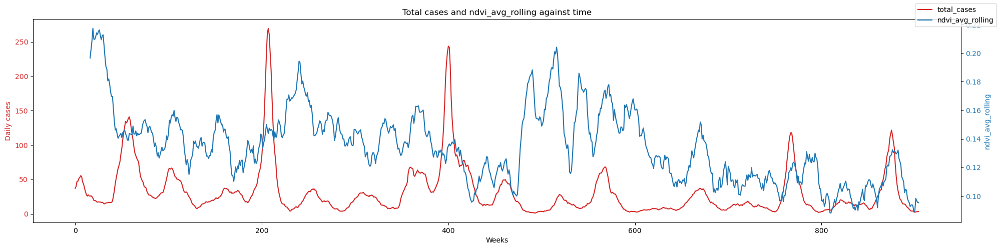

In [15]:
# Vegetation 
#add ndvi
Xy_sj['ndvi_avg'] = Xy_sj.loc[:,['ndvi_nw','ndvi_se','ndvi_sw']].mean(axis=1)  # Trying with ndvi_ne remove as lots of missing values 
Xy_sj['ndvi_avg_rolling'] = Xy_sj['ndvi_avg'].rolling(16, center=False).mean().shift()

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'ndvi_avg_rolling'
dv.feature_output_chart(data, y, feature, city='sj')

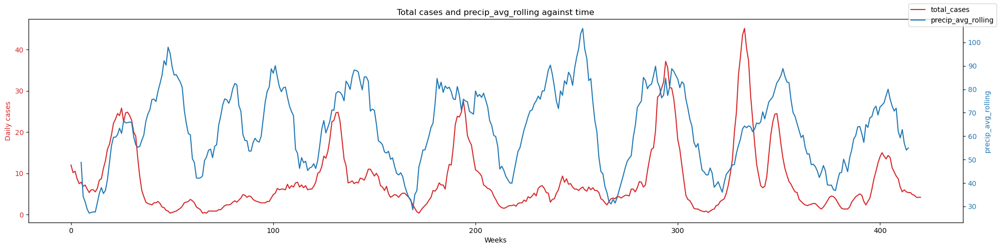

In [16]:
# Precipitation 
Xy_iq['precip_avg'] = Xy_iq[['reanalysis_sat_precip_amt_mm','station_precip_mm','precipitation_amt_mm','reanalysis_precip_amt_kg_per_m2']].mean(axis=1)
Xy_iq['precip_avg_rolling'] = Xy_iq['precip_avg'].rolling(12, center=False).mean().shift(-6)
Xy_iq['precip_avg_evm'] = Xy_iq['precip_avg'].ewm(span=8).mean()
#Xy_iq['precip_diff'] = Xy_iq['precip_avg'] - Xy_iq.shift(1)['precip_avg']

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'precip_avg_rolling'
dv.feature_output_chart(data, y, feature, city='iq')


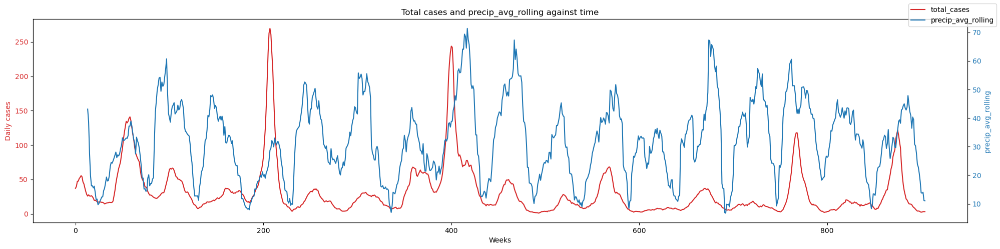

In [17]:
# Precipitation 
Xy_sj['precip_avg'] = Xy_sj[['reanalysis_sat_precip_amt_mm','station_precip_mm','precipitation_amt_mm','reanalysis_precip_amt_kg_per_m2']].mean(axis=1)
Xy_sj['precip_avg_rolling'] = Xy_sj['precip_avg'].rolling(14, center=False).mean()
Xy_sj['precip_avg_evm'] = Xy_sj['precip_avg'].ewm(span=8).mean()
#Xy_iq['precip_diff'] = Xy_iq['precip_avg'] - Xy_iq.shift(1)['precip_avg']

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'precip_avg_rolling'
dv.feature_output_chart(data, y, feature, city='sj')


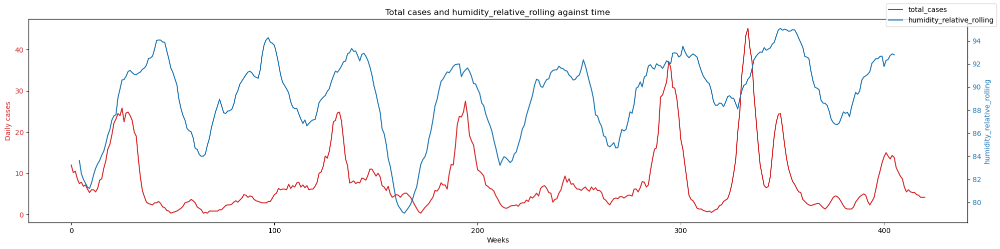

In [18]:
# Humidity 
Xy_iq['humidity_relative_rolling'] = Xy_iq['reanalysis_relative_humidity_percent'].rolling(20, center=True).mean().shift(-6)
Xy_iq['humidity_specific_rolling'] = Xy_iq['reanalysis_specific_humidity_g_per_kg'].rolling(18, center=True).mean().shift(-4)
Xy_iq['humidity_relative_evm'] = Xy_iq['reanalysis_relative_humidity_percent'].ewm(span=20).mean()
Xy_iq['humidity_specific_evm'] = Xy_iq['reanalysis_relative_humidity_percent'].ewm(span=40).mean()
#Xy_iq['precip_diff'] = Xy_iq['precip_avg'] - Xy_iq.shift(1)['precip_avg']

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'humidity_relative_rolling'
dv.feature_output_chart(data, y, feature, city='iq')

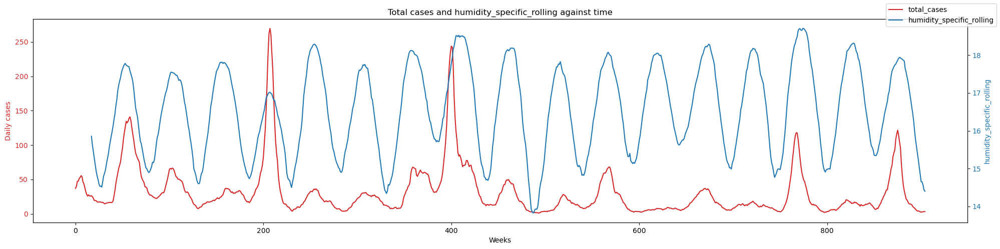

In [19]:
# Humidity 
Xy_sj['humidity_relative_rolling'] = Xy_sj['reanalysis_relative_humidity_percent'].rolling(20, center=False).mean() #.shift(4)
Xy_sj['humidity_specific_rolling'] = Xy_sj['reanalysis_specific_humidity_g_per_kg'].rolling(18, center=False).mean()
Xy_sj['humidity_relative_evm'] = Xy_sj['reanalysis_relative_humidity_percent'].ewm(span=40).mean()
Xy_sj['humidity_specific_evm'] = Xy_sj['reanalysis_relative_humidity_percent'].ewm(span=40).mean()
#Xy_iq['precip_diff'] = Xy_iq['precip_avg'] - Xy_iq.shift(1)['precip_avg']

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'humidity_specific_rolling'
dv.feature_output_chart(data, y, feature, city='sj')

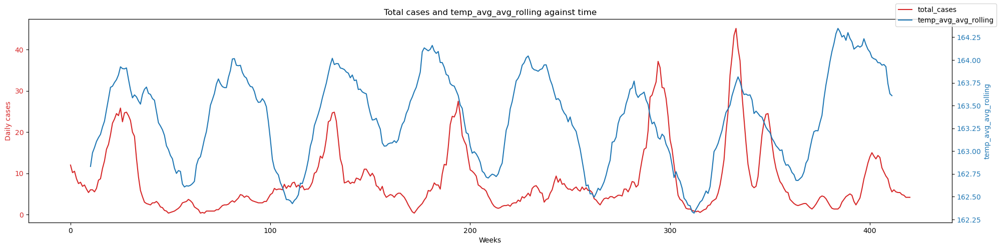

In [20]:
# Avg temperature for iq
Xy_iq['temp_avg_avg'] = Xy_iq[['station_avg_temp_c','reanalysis_avg_temp_k']].mean(axis=1)

Xy_iq['temp_avg_avg_rolling'] = Xy_iq['temp_avg_avg'].rolling(20, center=True).mean() #.shift(4)
Xy_iq['temp_avg_avg_evm'] = Xy_iq['temp_avg_avg'].ewm(span=30).mean()

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'temp_avg_avg_rolling'
dv.feature_output_chart(data, y, feature, city='iq')


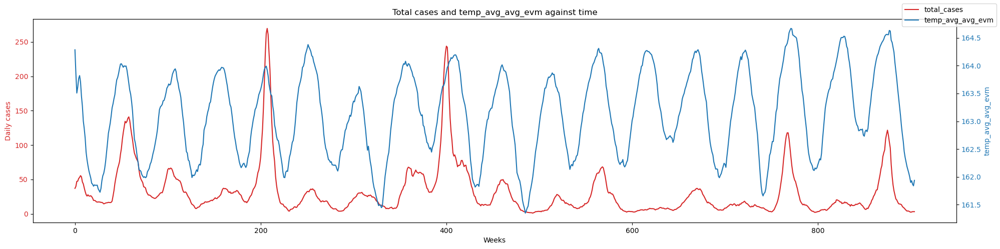

In [21]:
# Avg temperature for sj
Xy_sj['temp_avg_avg'] = Xy_sj[['station_avg_temp_c','reanalysis_avg_temp_k']].mean(axis=1)

Xy_sj['temp_avg_avg_rolling'] = Xy_sj['temp_avg_avg'].rolling(12, center=False).mean() #.shift(4)
Xy_sj['temp_avg_avg_evm'] = Xy_sj['temp_avg_avg'].ewm(span=20).mean()
#Xy_iq['precip_diff'] = Xy_iq['precip_avg'] - Xy_iq.shift(1)['precip_avg']

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'temp_avg_avg_evm'
dv.feature_output_chart(data, y, feature, city='sj')


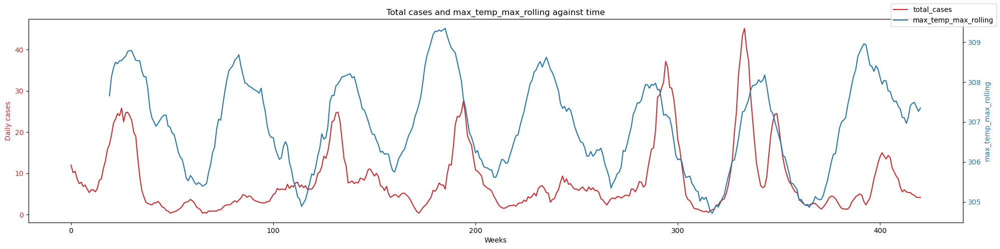

In [22]:
# Max temperatures for iq
Xy_iq['max_temp_max'] = Xy_iq[['station_max_temp_c','reanalysis_max_air_temp_k']].max(axis=1)
Xy_iq['max_temp_avg'] = Xy_iq[['station_max_temp_c','reanalysis_max_air_temp_k']].mean(axis=1)

Xy_iq['max_temp_max_rolling'] = Xy_iq['max_temp_max'].rolling(20, center=False).mean() #.shift(4)
Xy_iq['max_temp_max_ewm'] = Xy_iq['max_temp_max'].ewm(span=40).mean()
Xy_iq['max_temp_avg_rolling'] = Xy_iq['max_temp_avg'].rolling(20, center=False).mean() #.shift(4)
Xy_iq['max_temp_avg_ewm'] = Xy_iq['max_temp_avg'].ewm(span=40).mean()

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'max_temp_max_rolling'
dv.feature_output_chart(data, y, feature, city='iq')

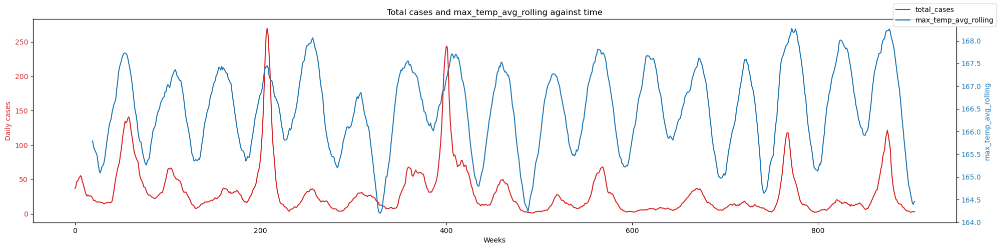

In [23]:
# Max temperatures for sj
Xy_sj['max_temp_max'] = Xy_sj[['station_max_temp_c','reanalysis_max_air_temp_k']].max(axis=1)
Xy_sj['max_temp_avg'] = Xy_sj[['station_max_temp_c','reanalysis_max_air_temp_k']].mean(axis=1)

Xy_sj['max_temp_max_rolling'] = Xy_sj['max_temp_max'].rolling(20, center=False).mean() #.shift(4)
Xy_sj['max_temp_max_ewm'] = Xy_sj['max_temp_max'].ewm(span=40).mean()
Xy_sj['max_temp_avg_rolling'] = Xy_sj['max_temp_avg'].rolling(20, center=False).mean() #.shift(4)
Xy_sj['max_temp_avg_ewm'] = Xy_sj['max_temp_avg'].ewm(span=40).mean()
#Xy_iq['precip_diff'] = Xy_iq['precip_avg'] - Xy_iq.shift(1)['precip_avg']

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'max_temp_avg_rolling'
dv.feature_output_chart(data, y, feature, city='sj')

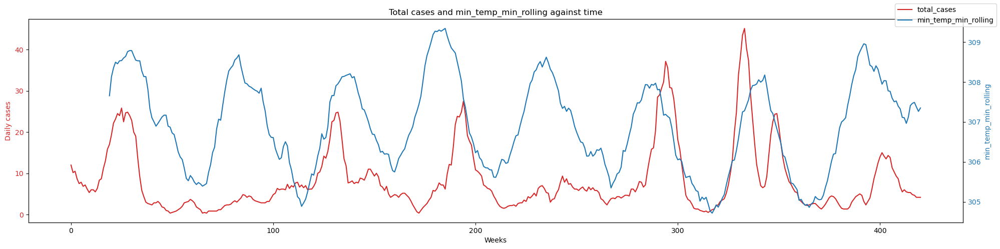

In [24]:
# Min temperatures for iq
Xy_iq['min_temp_min'] = Xy_iq[['station_min_temp_c','reanalysis_max_air_temp_k']].max(axis=1)
Xy_iq['min_temp_avg'] = Xy_iq[['station_min_temp_c','reanalysis_min_air_temp_k']].mean(axis=1)

Xy_iq['min_temp_min_rolling'] = Xy_iq['min_temp_min'].rolling(20, center=False).mean() #.shift(4)
Xy_iq['min_temp_min_ewm'] = Xy_iq['min_temp_min'].ewm(span=40).mean()
Xy_iq['min_temp_avg_rolling'] = Xy_iq['min_temp_avg'].rolling(20, center=False).mean() #.shift(4)
Xy_iq['min_temp_avg_ewm'] = Xy_iq['min_temp_avg'].ewm(span=40).mean()
#Xy_iq['precip_diff'] = Xy_iq['precip_avg'] - Xy_iq.shift(1)['precip_avg']

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'min_temp_min_rolling'
dv.feature_output_chart(data, y, feature, city='iq')

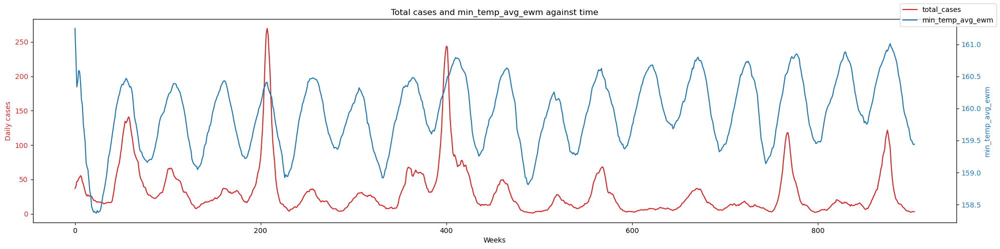

In [25]:
# Min temperatures for sj
Xy_sj['min_temp_min'] = Xy_sj[['station_min_temp_c','reanalysis_max_air_temp_k']].max(axis=1)
Xy_sj['min_temp_avg'] = Xy_sj[['station_min_temp_c','reanalysis_min_air_temp_k']].mean(axis=1)

Xy_sj['min_temp_min_rolling'] = Xy_sj['min_temp_min'].rolling(20, center=False).mean() #.shift(4)
Xy_sj['min_temp_min_ewm'] = Xy_sj['min_temp_min'].ewm(span=40).mean()
Xy_sj['min_temp_avg_rolling'] = Xy_sj['min_temp_avg'].rolling(20, center=False).mean() #.shift(4)
Xy_sj['min_temp_avg_ewm'] = Xy_sj['min_temp_avg'].ewm(span=40).mean()
#Xy_iq['precip_diff'] = Xy_iq['precip_avg'] - Xy_iq.shift(1)['precip_avg']

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'min_temp_avg_ewm'
dv.feature_output_chart(data, y, feature, city='sj')

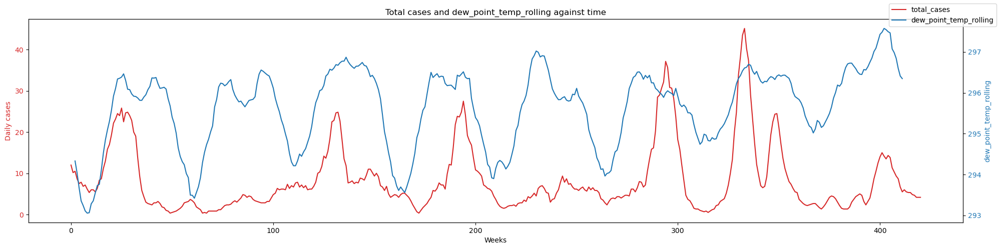

In [26]:
# Dew temperature IQ
Xy_iq['dew_point_temp_rolling'] = Xy_iq['reanalysis_dew_point_temp_k'].rolling(12, center=True).mean().shift(-4)
Xy_iq['dew_point_temp_rolling_ewm'] = Xy_iq['reanalysis_dew_point_temp_k'].ewm(span=40).mean()

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'dew_point_temp_rolling'
dv.feature_output_chart(data, y, feature, city='iq')

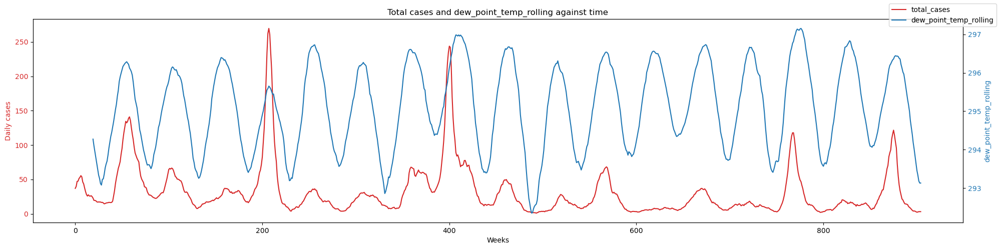

In [27]:
# Dew temperature SJ
Xy_sj['dew_point_temp_rolling'] = Xy_sj['reanalysis_dew_point_temp_k'].rolling(20, center=False).mean() #.shift(4)
Xy_sj['dew_point_temp_rolling_ewm'] = Xy_sj['reanalysis_dew_point_temp_k'].ewm(span=40).mean()

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'dew_point_temp_rolling'
dv.feature_output_chart(data, y, feature, city='sj')

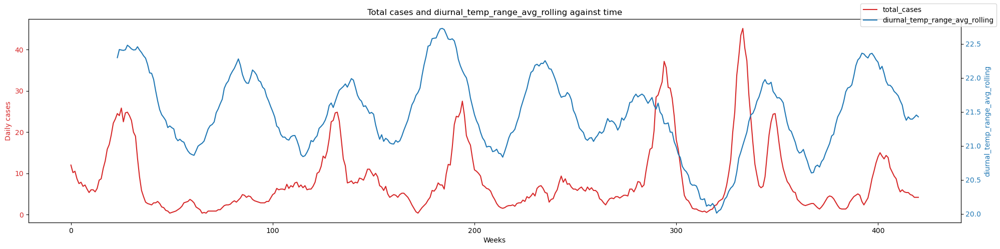

In [28]:
# Diurnal temperatures ranges for iq
Xy_iq['diurnal_temp_range_avg'] = Xy_iq[['reanalysis_tdtr_k','station_diur_temp_rng_c']].mean(axis=1)
Xy_iq['diurnal_temp_range_avg_rolling'] = Xy_iq['diurnal_temp_range_avg'].rolling(24, center=False).mean() #.shift(4)

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'diurnal_temp_range_avg_rolling'
dv.feature_output_chart(data, y, feature, city='iq')

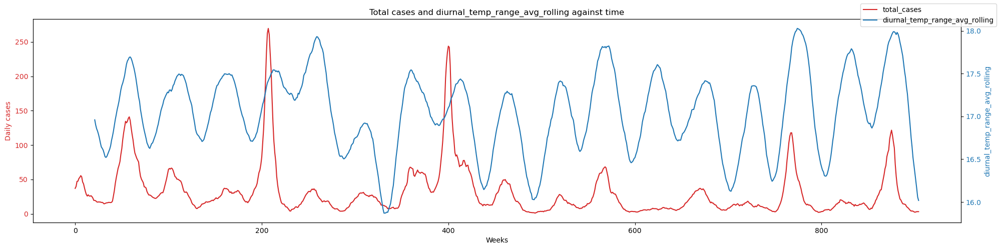

In [29]:
# Diurnal temperatures ranges for sj
Xy_sj['diurnal_temp_range_avg'] = Xy_sj[['reanalysis_tdtr_k','station_diur_temp_rng_c']].mean(axis=1)
Xy_sj['diurnal_temp_range_avg_rolling'] = Xy_sj['diurnal_temp_range_avg'].rolling(22, center=False).mean() #.shift(4)

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'diurnal_temp_range_avg_rolling'
dv.feature_output_chart(data, y, feature, city='sj')

## Try combining different related features

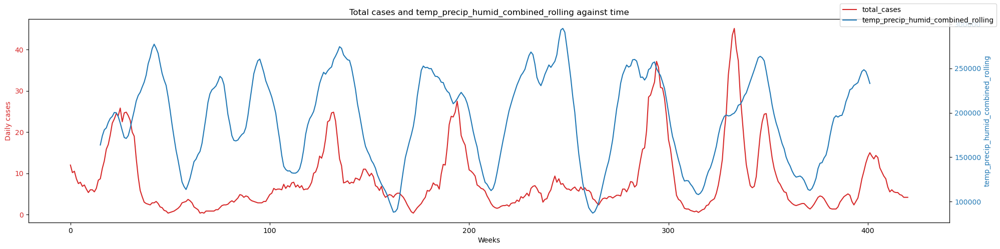

In [30]:
# Temperature, precipitation, humidity could all be related : try multiplying together 
Xy_iq['temp_precip_humid_combined'] = Xy_iq['max_temp_avg_rolling'] * Xy_iq['precip_avg_rolling'] * Xy_iq['humidity_specific_rolling'] 
Xy_iq['temp_precip_humid_combined_rolling'] = Xy_iq['temp_precip_humid_combined'].rolling(4, center=True).mean().shift(-6)

data = Xy_iq
y = Xy_iq['total_cases']
feature = 'temp_precip_humid_combined_rolling'
dv.feature_output_chart(data, y, feature, city='iq')

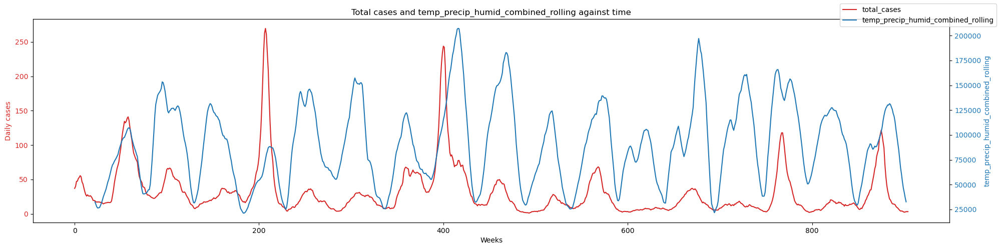

In [31]:
# Temperature, precipitation, humidity could all be related : try multiplying together 
Xy_sj['temp_precip_humid_combined'] = Xy_sj['max_temp_avg_rolling'] * Xy_sj['precip_avg_rolling'] * Xy_sj['humidity_specific_rolling'] 
Xy_sj['temp_precip_humid_combined_rolling'] = Xy_sj['temp_precip_humid_combined'].rolling(6, center=True).mean()

data = Xy_sj
y = Xy_sj['total_cases']
feature = 'temp_precip_humid_combined_rolling'
dv.feature_output_chart(data, y, feature, city='sj')

In [32]:
print(Xy_sj.shape, Xy_iq.shape)

(905, 74) (421, 74)


### Dashboard

In [33]:
# Plotly plot 
import plotly.io as pio
#pio.renderers.default = "browser"
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px

scaler = MinMaxScaler()
sj_scaled = scaler.fit_transform(Xy_sj)
sj_scaled = pd.DataFrame(columns=Xy_sj.columns, data= sj_scaled, index=Xy_sj.index)
iq_scaled = scaler.fit_transform(Xy_iq)
iq_scaled = pd.DataFrame(columns=Xy_iq.columns, data= iq_scaled, index=Xy_iq.index)

fig = make_subplots(rows=2, cols=1, shared_xaxes=True, subplot_titles = ["San Juan", "Iquitos"], 
                    vertical_spacing=0.02)
n_colors = iq_scaled.shape[1]
colors = px.colors.sample_colorscale("turbo", [n/(n_colors -1) for n in range(n_colors)])


for i, c in enumerate(sj_scaled.columns):
    fig.add_trace(go.Scatter(x=sj_scaled.index, 
                             y=sj_scaled.loc[:,c],
                             mode='lines', # 'lines' or 'markers'
                             name=c,
                             line_color=colors[i],
                             legendgroup=f'group{i}',
                             showlegend=False,),
                  
                  row=1, col=1)

for i, c in enumerate(iq_scaled.columns):
    fig.add_trace(go.Scatter(x=iq_scaled.index, 
                             y=iq_scaled.loc[:,c],
                             mode='lines', # 'lines' or 'markers'
                             line_color=colors[i],
                             legendgroup=f'group{i}',
                             name=c),
                 row=2, col=1)
fig.show()

### Select features that we want for the model

In [34]:
# Select features to include
columns_1 = ['total_cases',
           'ndvi_avg_rolling','precip_avg_rolling','humidity_relative_rolling','humidity_specific_rolling',
           'temp_avg_avg_rolling','max_temp_avg_rolling','min_temp_min_rolling','dew_point_temp_rolling',
           'diurnal_temp_range_avg_rolling','temp_precip_humid_combined_rolling',
           'part_of_year', 'seasonality', 'cos_week_shift']
columns_2 = ['total_cases',
           'ndvi_avg_rolling','precip_avg_rolling','humidity_relative_rolling','humidity_specific_rolling',
           'temp_avg_avg_rolling','max_temp_avg_rolling','min_temp_min_rolling', 'dew_point_temp_rolling', 
           'diurnal_temp_range_avg_rolling','temp_precip_humid_combined_rolling',
           'ndvi_ne_rolling', 'ndvi_nw_rolling', 'precipitation_amt_mm_rolling',
           'reanalysis_air_temp_k_rolling', 'reanalysis_avg_temp_k_rolling',
           'reanalysis_dew_point_temp_k_rolling','reanalysis_max_air_temp_k_rolling',
           'reanalysis_precip_amt_kg_per_m2_rolling', 'reanalysis_relative_humidity_percent_rolling',
           'reanalysis_sat_precip_amt_mm_rolling','reanalysis_specific_humidity_g_per_kg_rolling',
           'reanalysis_tdtr_k_rolling', 'station_avg_temp_c_rolling',
           'station_diur_temp_rng_c_rolling', 'station_precip_mm_rolling',
           'ndvi_se_rolling', 'ndvi_sw_rolling',
           'reanalysis_min_air_temp_k_rolling', 'station_min_temp_c_rolling',
           'part_of_year','seasonality', 'cos_week_shift']
columns_3 = ['total_cases','humidity_relative_rolling','humidity_specific_rolling',
           'temp_avg_avg_rolling','max_temp_avg_rolling','min_temp_min_rolling','dew_point_temp_rolling',
           'diurnal_temp_range_avg_rolling','part_of_year', 'seasonality']
columns_4= ['total_cases','max_temp_avg_rolling','dew_point_temp_rolling','part_of_year', 'seasonality'] 

Xy_iq = Xy_iq.loc[:, columns_4]
Xy_sj = Xy_sj.loc[:, columns_4]



In [35]:
# Fill in or drop missing values from new features 
#Xy_iq = Xy_iq.fillna(method="ffill")
Xy_iq = Xy_iq.dropna()
#Xy_sj = Xy_sj.fillna(method="ffill")
Xy_sj = Xy_sj.dropna()
assert Xy_iq.isnull().any().any() == False
assert Xy_sj.isnull().any().any() == False

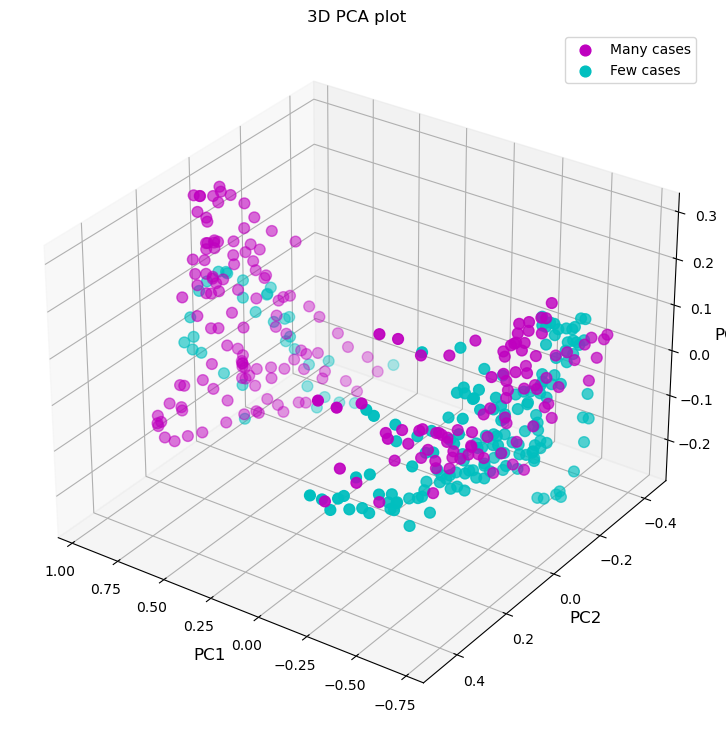

In [36]:
# Try dimensionality reduction with PCA for Iquitos
y = Xy_iq['total_cases'].apply(lambda row: 1 if row > 6 else 0)
X = Xy_iq.drop(['total_cases'], axis=1)
scaler = MinMaxScaler()
scaler.fit(X)
X = scaler.transform(X)
pca = PCA(n_components=3)
pca.fit(X)
X_pca3 = pca.transform(X)

# 3D plot
Xax = X_pca3[:,0]
Yax = X_pca3[:,1]
Zax = X_pca3[:,2]

cdict = {0:'m',1:'c'}
label = {0:'Many cases',1:'Few cases'}

fig = plt.figure(figsize=(14,9))
ax = fig.add_subplot(111, projection='3d')
 
for l in np.unique(y):
    ix=np.where(y==l)
    ax.scatter(Xax[ix], Yax[ix], Zax[ix], c=cdict[l], s=60, label=label[l])
ax.set_xlabel("PC1", fontsize=12)
ax.set_ylabel("PC2", fontsize=12)
ax.set_zlabel("PC3", fontsize=12)
ax.view_init(30, 125)
ax.legend()
plt.title("3D PCA plot")
plt.show()

# Add PCA as features
Xy_iq['PCA_1'] = list(X_pca3[:,0])
Xy_iq['PCA_2'] = list(X_pca3[:,1])
Xy_iq['PCA_3'] = list(X_pca3[:,2])


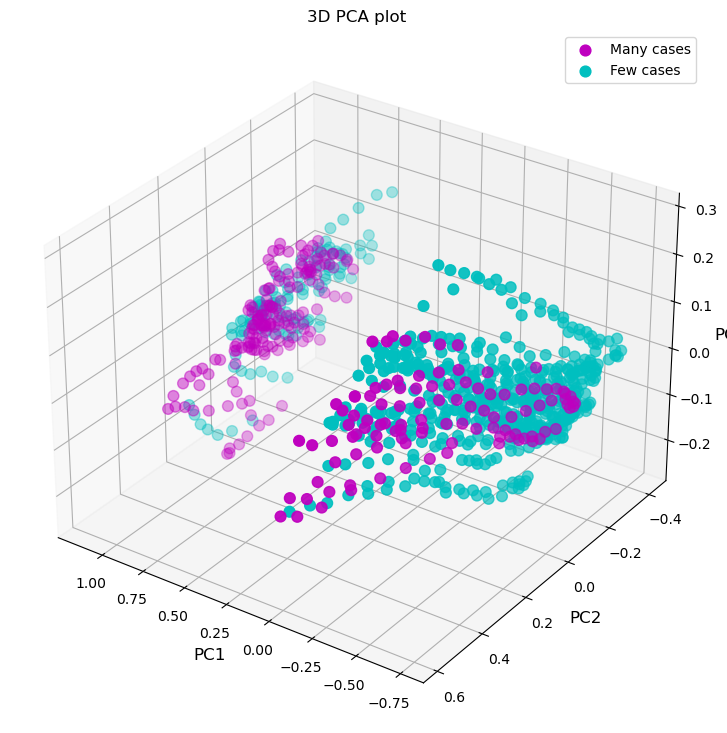

In [37]:
# Try dimensionality reduction with PCA for Iquitos
y = Xy_sj['total_cases'].apply(lambda row: 1 if row > 12 else 0)
X = Xy_sj.drop(['total_cases'], axis=1)
scaler = MinMaxScaler()
scaler.fit(X)
X = scaler.transform(X)
pca = PCA(n_components=3)
pca.fit(X)
X_pca3 = pca.transform(X)

# 3D plot
Xax = X_pca3[:,0]
Yax = X_pca3[:,1]
Zax = X_pca3[:,2]

cdict = {0:'m',1:'c'}
label = {0:'Many cases',1:'Few cases'}

fig = plt.figure(figsize=(14,9))
ax = fig.add_subplot(111, projection='3d')
 
for l in np.unique(y):
    ix=np.where(y==l)
    ax.scatter(Xax[ix], Yax[ix], Zax[ix], c=cdict[l], s=60, label=label[l])
ax.set_xlabel("PC1", fontsize=12)
ax.set_ylabel("PC2", fontsize=12)
ax.set_zlabel("PC3", fontsize=12)
ax.view_init(30, 125)
ax.legend()
plt.title("3D PCA plot")
plt.show()


# Add PCA as features
Xy_sj['PCA_1'] = list(X_pca3[:,0])
Xy_sj['PCA_2'] = list(X_pca3[:,1])
Xy_sj['PCA_3'] = list(X_pca3[:,2])

Text(0.5, 1.0, 'Iquitos Variable Correlations')

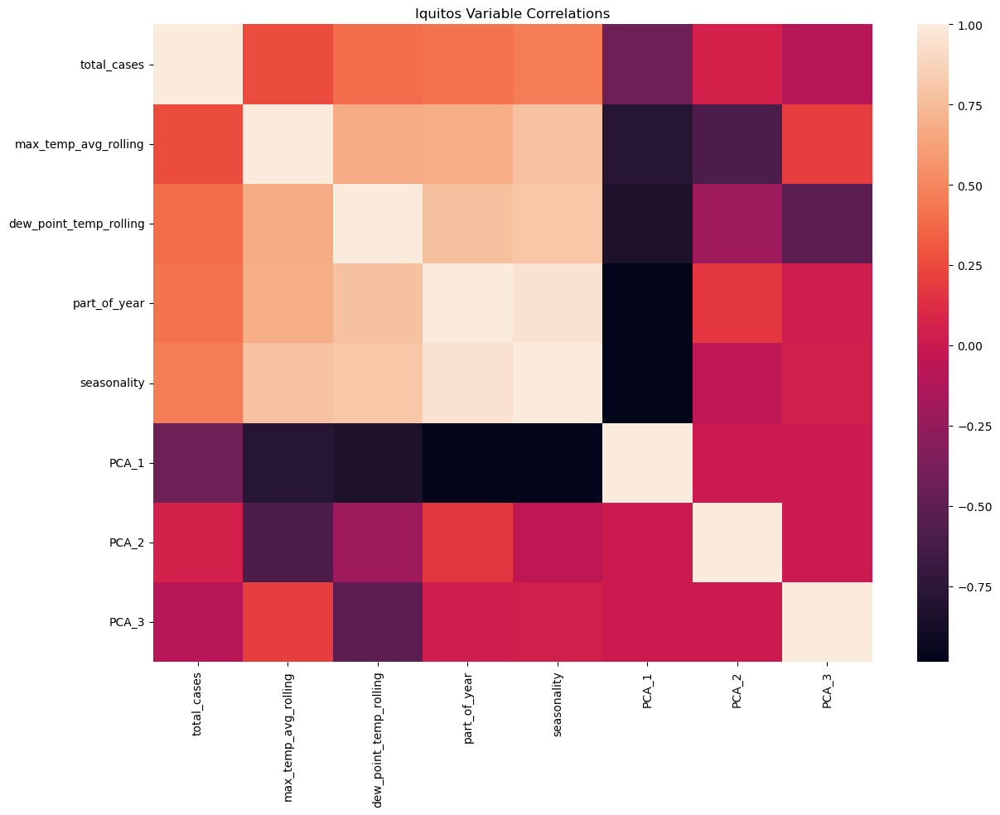

In [38]:
plt.figure(figsize=(14,10))
iq_corr_heat = sns.heatmap(Xy_iq.corr()) 
plt.title('Iquitos Variable Correlations') 

Text(0.5, 1.0, 'San Juan Variable Correlations')

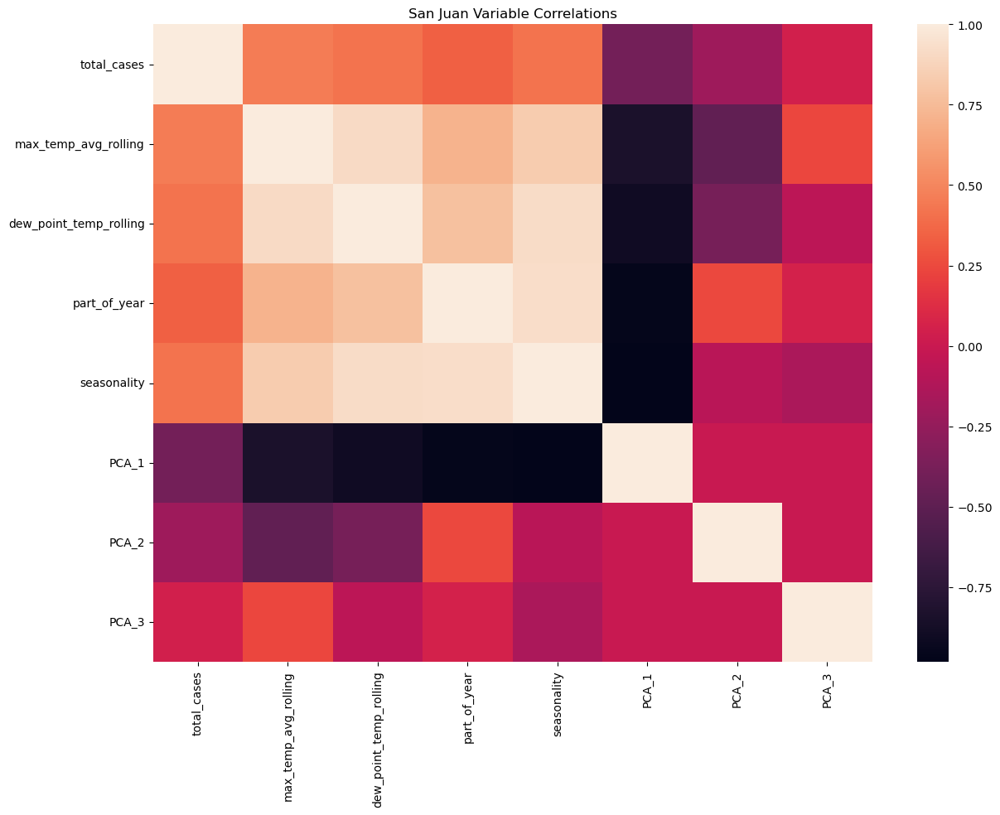

In [39]:
plt.figure(figsize=(14,10))
sj_corr_heat = sns.heatmap(Xy_sj.corr()) 
plt.title('San Juan Variable Correlations') 

Text(0.5, 1.0, 'San Juan Variable Correlations')

<Figure size 1400x1000 with 0 Axes>

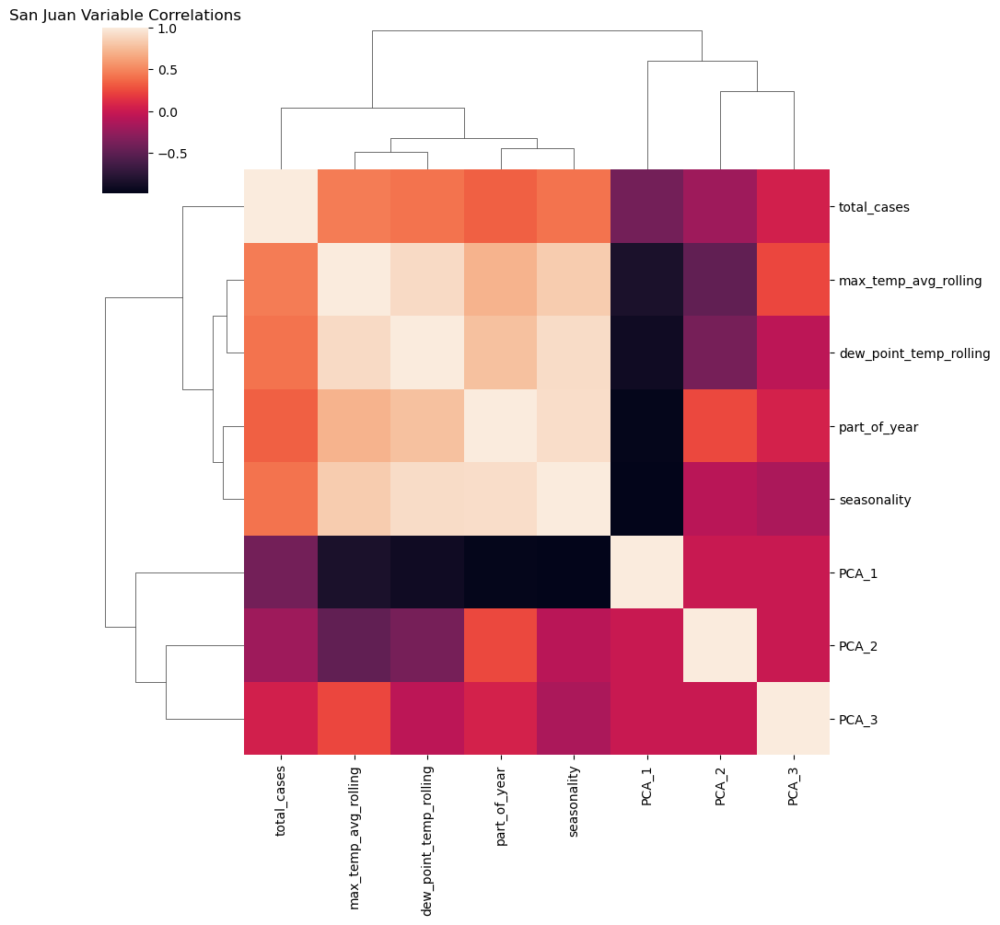

In [40]:
plt.figure(figsize=(14,10))
sj_corr_heat = sns.clustermap(Xy_sj.corr())
plt.title('San Juan Variable Correlations')

In [41]:
# Select final columns for model

columns_4= ['total_cases','max_temp_avg_rolling','dew_point_temp_rolling','part_of_year', 'seasonality'] 
columns_5= ['total_cases','part_of_year', 'seasonality'] 
columns_6= ['total_cases','part_of_year', 'seasonality','dew_point_temp_rolling'] 

Xy_iq = Xy_iq.loc[:, columns_6]
Xy_sj = Xy_sj.loc[:, columns_6]


## 3) Train models

In [42]:
# Split data into X and y
X_iq = Xy_iq.drop(labels=['total_cases'], axis=1)
y_iq = Xy_iq['total_cases']
X_sj = Xy_sj.drop(labels=['total_cases'], axis=1)
y_sj = Xy_sj['total_cases']
assert len(X_iq) == len(y_iq)

### Baseline model

Using the mean daily cases (by city) as the prediction

For training data:
- For Iquitos:  MAE 6.4
- For San Juan: MAE 24.3

For test data after submission:
**MAE 27.9**

In [43]:
# Baseline model predictions for Iquitos (Iq)
bl_pred_train = np.tile(np.mean(y_iq), len(y_iq))
bl_pred_test = np.tile(np.mean(y_iq), len(y_iq))
print('For Iquitos: ')
regression_evaluation(y_iq, y_iq, bl_pred_train, bl_pred_test)

# Baseline model predictions for San Jose (sj)
bl_pred_train = np.tile(np.mean(y_sj), len(y_sj))
bl_pred_test = np.tile(np.mean(y_sj), len(y_sj))
print('For San Jose: ')
regression_evaluation(y_sj, y_sj, bl_pred_train, bl_pred_test)

For Iquitos: 

    Evaluation metrics:
        RMSE train: 8.262865583163578
        RMSE test: 8.262865583163578
        MAE train: 6.053596980232957
        MAE test: 6.053596980232957 
    
For San Jose: 

    Evaluation metrics:
        RMSE train: 37.3749053757765
        RMSE test: 37.3749053757765
        MAE train: 24.01436355514338
        MAE test: 24.01436355514338 
    


(37.3749053757765, 37.3749053757765, 24.01436355514338, 24.01436355514338)

### Poisson regression model

In [44]:
warnings.filterwarnings('ignore') 
# Poisson regression model for iq
X, y = X_iq, y_iq
score_iq = lm.poisson_reg_model(X, y)
print(score_iq.loc[score_iq['TSS iteration']==1,:].sort_values(by='mae_test', ascending=True).head(4))
print(score_iq.loc[score_iq['TSS iteration']==2,:].sort_values(by='mae_test', ascending=True).head(4))

   TSS iteration  rmse_test  rmse_train  mae_test  mae_train  alpha  mat_iter
2              1   4.637495    6.467550  3.424510   5.227352    1.0       100
3              1   4.637495    6.467550  3.424510   5.227352    1.0       200
0              1   4.646307    6.450449  3.444768   5.233517    0.6       100
1              1   4.646307    6.450449  3.444768   5.233517    0.6       200
   TSS iteration  rmse_test  rmse_train  mae_test  mae_train  alpha  mat_iter
4              2  10.297177    5.625915  6.664974   4.227552    0.6       100
5              2  10.297177    5.625915  6.664974   4.227552    0.6       200
6              2  10.317940    5.638340  6.680489   4.223385    1.0       100
7              2  10.317940    5.638340  6.680489   4.223385    1.0       200


In [45]:
# Poisson regression model for sj
X, y = X_sj, y_sj
score_sj = lm.poisson_reg_model(X, y)
print(score_sj.loc[score_sj['TSS iteration']==1,:].sort_values(by='mae_test', ascending=True).head(4))
print(score_sj.loc[score_sj['TSS iteration']==2,:].sort_values(by='mae_test', ascending=True).head(4))

   TSS iteration  rmse_test  rmse_train   mae_test  mae_train  alpha  mat_iter
2              1  39.709470   34.047208  24.632105  21.103096    1.0       100
3              1  39.709470   34.047208  24.632105  21.103096    1.0       200
0              1  40.519073   33.444585  24.989559  20.722686    0.6       100
1              1  40.519073   33.444585  24.989559  20.722686    0.6       200
   TSS iteration  rmse_test  rmse_train   mae_test  mae_train  alpha  mat_iter
6              2  31.630613   36.727681  26.696571  21.448344    1.0       100
7              2  31.630613   36.727681  26.696571  21.448344    1.0       200
4              2  31.695807   36.732648  26.707327  21.453677    0.6       100
5              2  31.695807   36.732648  26.707327  21.453677    0.6       200


<Axes: >

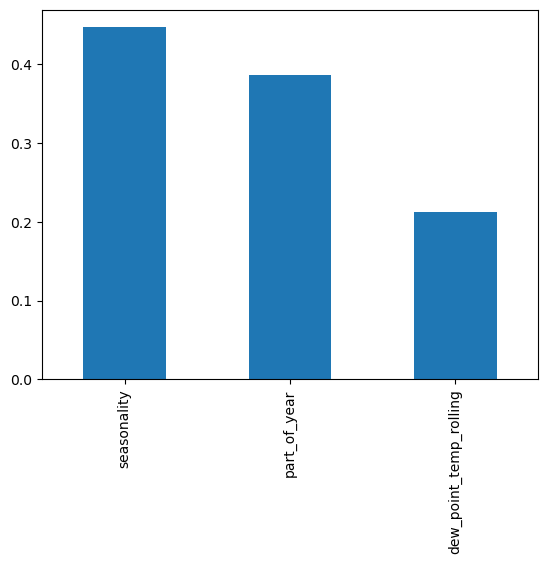

In [46]:
# Poisson get parameters for iq 
X, y = X_iq, y_iq
coefs = lm.poisson_get_coefs(X, y)
coefs.sort_values(ascending=False).plot.bar()

<Axes: >

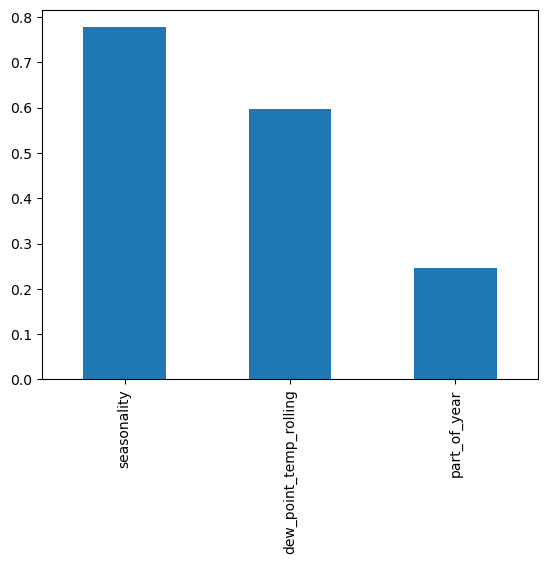

In [47]:
# Poisson get parameters for sj 
X, y = X_sj, y_sj
coefs = lm.poisson_get_coefs(X, y)
coefs.sort_values(ascending=False).plot.bar()

### Random forest model

In [48]:
# Random forest model for iq
X, y = X_iq, y_iq
score_iq = tm.rforest_model(X, y)
print(score_iq.loc[score_iq['TSS iteration']==1,:].sort_values(by='mae_test', ascending=True).head(4))
print(score_iq.loc[score_iq['TSS iteration']==2,:].sort_values(by='mae_test', ascending=True).head(4))

   TSS iteration  rmse_test  rmse_train  mae_test  mae_train  n_estimators   
1              1   4.799323    5.273755  3.606736   4.300403           100  \
5              1   4.816200    5.291589  3.630028   4.296227           200   
0              1   4.864672    5.185999  3.654636   4.247963           100   
4              1   4.889028    5.266192  3.659307   4.300925           200   

   max_depth  min_samples_split  min_samples_leaf  
1          4                  5                 2  
5          4                  5                 2  
0          4                  2                 2  
4          4                  2                 2  
    TSS iteration  rmse_test  rmse_train  mae_test  mae_train  n_estimators   
9               2  10.273544    4.950612  6.906022   3.763587           100  \
8               2  10.260760    4.925275  6.924244   3.758796           100   
13              2  10.301967    4.915612  6.950100   3.731429           200   
12              2  10.311404    4

In [49]:
# Random forest model for sj
X, y = X_sj, y_sj
score_sj = tm.rforest_model(X, y)
print(score_sj.loc[score_sj['TSS iteration']==1,:].sort_values(by='mae_test', ascending=True).head(4))
print(score_sj.loc[score_sj['TSS iteration']==2,:].sort_values(by='mae_test', ascending=True).head(4))

   TSS iteration  rmse_test  rmse_train   mae_test  mae_train  n_estimators   
1              1  37.440021   25.917113  21.876162  17.743015           100  \
4              1  37.176381   26.048972  21.922502  17.671760           200   
5              1  37.422678   25.596483  22.023756  17.539245           200   
0              1  37.616478   25.376269  22.076282  17.418122           100   

   max_depth  min_samples_split  min_samples_leaf  
1          4                  5                 2  
4          4                  2                 2  
5          4                  5                 2  
0          4                  2                 2  
    TSS iteration  rmse_test  rmse_train   mae_test  mae_train  n_estimators   
15              2  30.051453   23.871911  24.497723  14.503641           200  \
14              2  30.160408   23.281580  24.570042  14.226973           200   
10              2  30.315369   23.853709  24.714084  14.638451           100   
11              2  30.56

<Axes: >

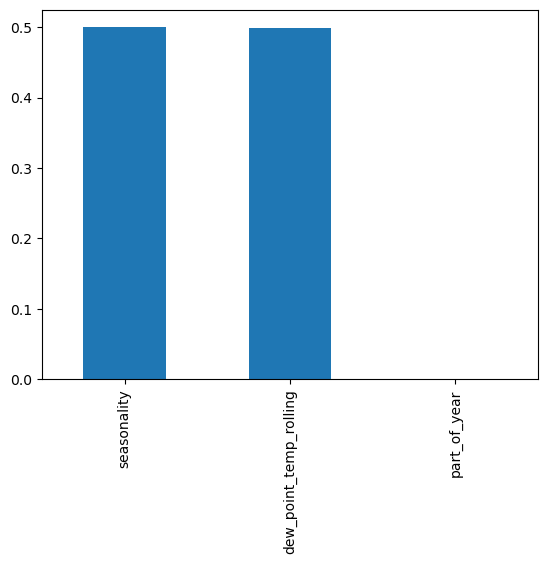

In [50]:
# Random forest feature importance for iq
X, y = X_iq, y_iq
feature_importances = tm.rf_feature_importance(X, y)
feature_importances.sort_values(ascending=False).plot.bar()

<Axes: >

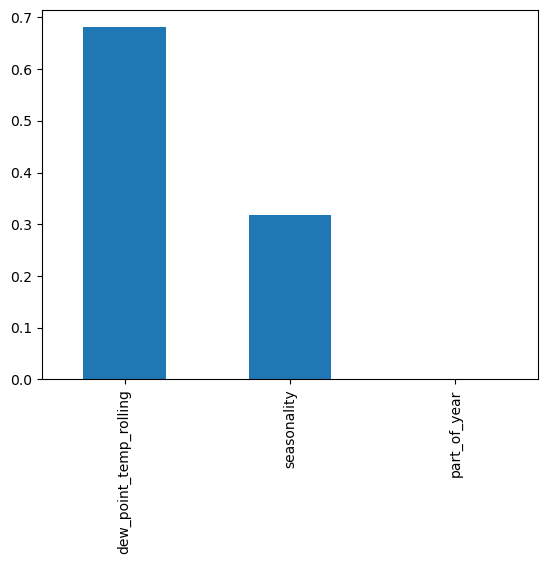

In [51]:
# Random forest feature importance for sj
X, y = X_sj, y_sj
feature_importances = tm.rf_feature_importance(X, y)
feature_importances.sort_values(ascending=False).plot.bar()

### XGBoost model

In [52]:
# XG boost model for iq
X, y = X_iq, y_iq
score_iq, plots_iq = tm.xg_model(X, y)

In [53]:
score_iq.loc[score_iq['TSS iteration']==1,:].sort_values(by='mae_test', ascending=True).head(4)

,TSS iteration,rmse_test,rmse_train,mae_test,mae_train,learning_rate,n_estimators,max_depth,subsample,colsample_bytree,reg_lambda,gamma
104,1,4.553946,6.372914,3.147706,4.886256,0.05,60,22,0.8,0.8,40,30
68,1,4.553946,6.372914,3.147706,4.886256,0.05,60,18,0.8,0.8,40,30
32,1,4.553946,6.372914,3.147706,4.886256,0.05,60,14,0.8,0.8,40,30
64,1,4.561615,6.345106,3.167767,4.855464,0.05,60,18,0.8,0.8,40,20


In [54]:
score_iq.loc[score_iq['TSS iteration']==2,:].sort_values(by='mae_test', ascending=True).head(4)

,TSS iteration,rmse_test,rmse_train,mae_test,mae_train,learning_rate,n_estimators,max_depth,subsample,colsample_bytree,reg_lambda,gamma
428,2,10.193197,5.189051,6.872697,3.913481,0.05,100,22,0.8,0.8,40,30
356,2,10.193197,5.189051,6.872697,3.913481,0.05,100,14,0.8,0.8,40,30
392,2,10.193197,5.189051,6.872697,3.913481,0.05,100,18,0.8,0.8,40,30
284,2,10.497481,5.461557,6.873729,3.946360,0.05,60,18,0.8,0.8,40,30


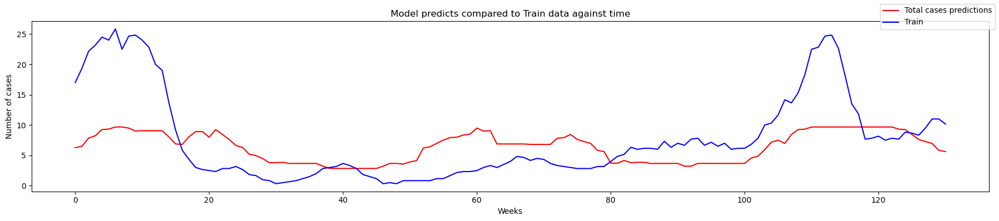

In [55]:
row = score_iq['mae_test'].argmin()
y_pred = plots_iq[row]['pred_train']
y = plots_iq[row]['y_train']
test_or_train = 'Train'
dv.plot_train_test(y_pred, y, test_or_train=test_or_train)


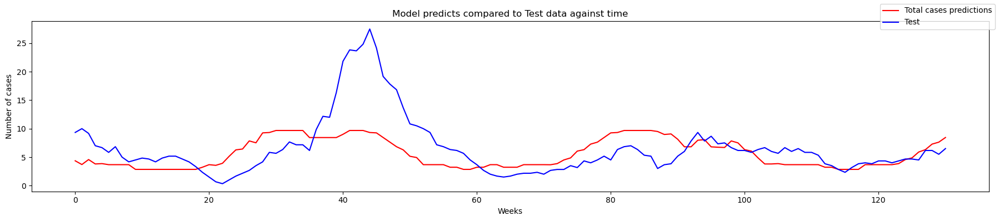

In [56]:
row = score_iq['mae_test'].argmin()
y_pred = plots_iq[row]['pred_test']
y = plots_iq[row]['y_test']
test_or_train = 'Test'
dv.plot_train_test(y_pred, y, test_or_train=test_or_train)


In [57]:
# XG boost model for sj
X, y = X_sj, y_sj
tm.xg_model(X, y)
score_sj, plots_sj = tm.xg_model(X, y)

In [58]:
score_sj.loc[score_sj['TSS iteration']==1,:].sort_values(by='mae_test', ascending=True).head(4)

,TSS iteration,rmse_test,rmse_train,mae_test,mae_train,learning_rate,n_estimators,max_depth,subsample,colsample_bytree,reg_lambda,gamma
96,1,38.296302,34.705046,22.502315,19.066975,0.05,60,22,0.8,0.8,40,10
60,1,38.296302,34.705046,22.502315,19.066975,0.05,60,18,0.8,0.8,40,10
24,1,38.296302,34.705046,22.502315,19.066975,0.05,60,14,0.8,0.8,40,10
32,1,38.299120,34.712335,22.513216,19.090993,0.05,60,14,0.8,0.8,40,30


In [59]:
score_sj.loc[score_sj['TSS iteration']==2,:].sort_values(by='mae_test', ascending=True).head(4)

,TSS iteration,rmse_test,rmse_train,mae_test,mae_train,learning_rate,n_estimators,max_depth,subsample,colsample_bytree,reg_lambda,gamma
299,2,26.352095,28.991937,21.320568,15.575164,0.05,60,22,1.0,1.0,20,30
263,2,26.352095,28.991937,21.320568,15.575164,0.05,60,18,1.0,1.0,20,30
227,2,26.355621,28.990664,21.331691,15.585004,0.05,60,14,1.0,1.0,20,30
259,2,26.345753,28.980790,21.334217,15.559380,0.05,60,18,1.0,1.0,20,20


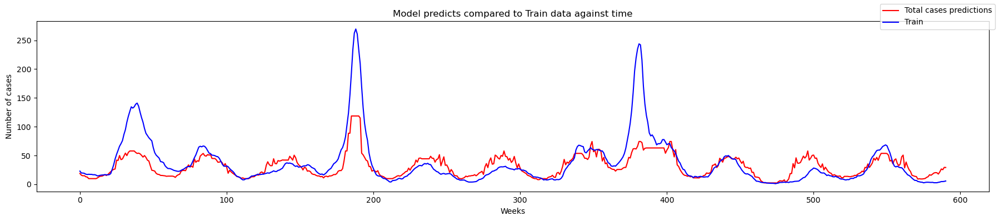

In [60]:
row = score_sj['mae_test'].argmin()
y_pred = plots_sj[row]['pred_train']
y = plots_sj[row]['y_train']
test_or_train = 'Train'
dv.plot_train_test(y_pred, y, test_or_train=test_or_train)


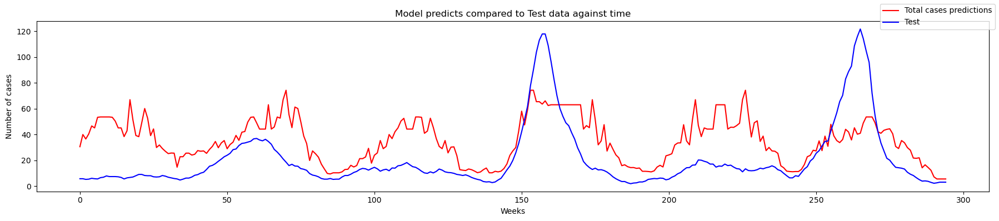

In [61]:
row = score_sj['mae_test'].argmin()
y_pred = plots_sj[row]['pred_test']
y = plots_sj[row]['y_test']
test_or_train = 'Test'
dv.plot_train_test(y_pred, y, test_or_train=test_or_train)

## 4) Predict on test data with chosen model and write file

Repeat the above transforms on the test set

In [62]:
# Code to run pipeline on dataset including test_features, and then take only test_features to run the final model
# Merge features and target data
data = pp.merge_data(train_features, train_target, test_features, inc_test=True, smooth_y=True)

# Run processing and split by city
Xy_iq_comb = pp.pre_process(data, 'iq', remove_anomalies=True, inc_test=True, smooth_y=False)
Xy_sj_comb = pp.pre_process(data, 'sj', remove_anomalies=True, inc_test=True, smooth_y=False)

# Run feature engineering 
Xy_iq_comb = fe.add_seasonality_factors(Xy_iq_comb, city='iq')
Xy_sj_comb = fe.add_seasonality_factors(Xy_sj_comb, city='sj')
Xy_iq_comb = fe.drop_date(Xy_iq_comb)
Xy_sj_comb = fe.drop_date(Xy_sj_comb)
Xy_iq_comb = fe.add_rolling(Xy_iq_comb, 'iq', fillna=False)
Xy_sj_comb = fe.add_rolling(Xy_sj_comb, 'sj', fillna=False)
Xy_iq_comb = fe.add_rolling_3(Xy_iq_comb, 'iq')
Xy_sj_comb = fe.add_rolling_3(Xy_sj_comb, 'sj')
print(f'Xy_iq_comb shape: {Xy_iq_comb.shape}') 
print(f'Xy_sj_comb shape: {Xy_sj_comb.shape}') 


Xy_iq_comb shape: (579, 74)
Xy_sj_comb shape: (1166, 74)


In [63]:
# Select features to include
columns_1 = ['total_cases',
           'ndvi_avg_rolling','precip_avg_rolling','humidity_relative_rolling','humidity_specific_rolling',
           'temp_avg_avg_rolling','max_temp_avg_rolling','min_temp_min_rolling','dew_point_temp_rolling',
           'diurnal_temp_range_avg_rolling','temp_precip_humid_combined_rolling',
           'part_of_year', 'seasonality', 'cos_week_shift']
columns_2 = ['total_cases',
           'ndvi_avg_rolling','precip_avg_rolling','humidity_relative_rolling','humidity_specific_rolling',
           'temp_avg_avg_rolling','max_temp_avg_rolling','min_temp_min_rolling', 'dew_point_temp_rolling', 
           'diurnal_temp_range_avg_rolling','temp_precip_humid_combined_rolling',
           'ndvi_ne_rolling', 'ndvi_nw_rolling', 'precipitation_amt_mm_rolling',
           'reanalysis_air_temp_k_rolling', 'reanalysis_avg_temp_k_rolling',
           'reanalysis_dew_point_temp_k_rolling','reanalysis_max_air_temp_k_rolling',
           'reanalysis_precip_amt_kg_per_m2_rolling', 'reanalysis_relative_humidity_percent_rolling',
           'reanalysis_sat_precip_amt_mm_rolling','reanalysis_specific_humidity_g_per_kg_rolling',
           'reanalysis_tdtr_k_rolling', 'station_avg_temp_c_rolling',
           'station_diur_temp_rng_c_rolling', 'station_precip_mm_rolling',
           'ndvi_se_rolling', 'ndvi_sw_rolling',
           'reanalysis_min_air_temp_k_rolling', 'station_min_temp_c_rolling',
           'part_of_year','seasonality', 'cos_week_shift']
columns_3 = ['total_cases','humidity_relative_rolling','humidity_specific_rolling',
           'temp_avg_avg_rolling','max_temp_avg_rolling','min_temp_min_rolling','dew_point_temp_rolling',
           'diurnal_temp_range_avg_rolling','part_of_year', 'seasonality']
columns_4= ['total_cases','max_temp_avg_rolling','dew_point_temp_rolling','part_of_year', 'seasonality'] 
columns_5= ['total_cases','part_of_year', 'seasonality'] 
columns_6= ['total_cases','part_of_year', 'seasonality','dew_point_temp_rolling'] 


Xy_iq_comb = Xy_iq_comb.loc[:, columns_6]
Xy_sj_comb = Xy_sj_comb.loc[:, columns_6]

In [64]:
# Fill in or drop missing values from new features 
Xy_iq_comb = Xy_iq_comb.fillna(method="ffill")
Xy_iq_comb = Xy_iq_comb.fillna(method="bfill")
#Xy_iq_comb = Xy_iq_comb.dropna()
Xy_sj_comb = Xy_sj_comb.fillna(method="ffill")
Xy_sj_comb = Xy_sj_comb.fillna(method="bfill")
#Xy_sj_comb = Xy_sj_comb.dropna()
assert Xy_iq_comb.isnull().any().any() == False
assert Xy_sj_comb.isnull().any().any() == False
print(f'Xy_iq_comb shape: {Xy_iq_comb.shape}') 
print(f'Xy_sj_comb shape: {Xy_sj_comb.shape}') 

Xy_iq_comb shape: (579, 4)
Xy_sj_comb shape: (1166, 4)


In [65]:
# Split data into X and y
X_iq_comb = Xy_iq_comb.drop(labels=['total_cases'], axis=1)
y_train_iq = Xy_iq_comb.loc[Xy_iq_comb['total_cases'] >= 0, Xy_iq_comb.columns == 'total_cases']
y_test_iq = Xy_iq_comb.loc[Xy_iq_comb['total_cases'] < 0, Xy_iq_comb.columns == 'total_cases']
X_sj_comb = Xy_sj_comb.drop(labels=['total_cases'], axis=1)
y_train_sj = Xy_sj_comb.loc[Xy_sj_comb['total_cases'] >= 0, Xy_sj_comb.columns == 'total_cases']
y_test_sj = Xy_sj_comb.loc[Xy_sj_comb['total_cases'] < 0, Xy_sj_comb.columns == 'total_cases']

# Take now only the test features 
X_train_iq = X_iq_comb.iloc[:(X_iq_comb.shape[0] - y_test_iq.shape[0]) , :]
X_train_sj = X_sj_comb.iloc[:(X_sj_comb.shape[0] - y_test_sj.shape[0]) , :]
X_test_iq = X_iq_comb.iloc[(X_iq_comb.shape[0] - y_test_iq.shape[0]): , :]
X_test_sj = X_sj_comb.iloc[(X_sj_comb.shape[0] - y_test_sj.shape[0]): , :]

print(X_train_iq.shape, y_train_iq.shape)
print(X_train_sj.shape, y_train_sj.shape)
print(y_test_iq.shape, y_test_sj.shape)
assert (X_train_iq.shape[0] == y_train_iq.shape[0])
assert (X_train_sj.shape[0] == y_train_sj.shape[0])

(423, 3) (423, 1)
(906, 3) (906, 1)
(156, 1) (260, 1)


In [66]:
# Select data and chosen model and hyperparameters for final prediction

# Iquitos, iq
X_test_iq = X_test_iq
X_train_iq = X_train_iq
y_train_iq = y_train_iq
model_iq = 'XGBRegressor'
params_iq = dict(learning_rate=0.05,
        n_estimators=80,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=1.0,
        reg_lambda=40,
        gamma=40)

# San Jose, sj
X_test_sj = X_test_sj
X_train_sj = X_train_sj
y_train_sj = y_train_sj
model_sj = 'XGBRegressor'
params_sj = dict(learning_rate=0.05,
        n_estimators=80,
        max_depth=6,
        subsample=0.8,
        colsample_bytree=0.8,
        reg_lambda=40,
        gamma=40)

print(X_test_iq.shape)
print(X_test_sj.shape)

(156, 3)
(260, 3)


In [67]:
# Do final prediction and create final DataFrame for submission 
iq_preds = fp.final_predict(X_test_iq, X_train_iq, y_train_iq, city='iq', model=model_iq, params=params_iq, include_PCA=False)
sj_preds = fp.final_predict(X_test_sj, X_train_sj, y_train_sj, city='sj', model=model_sj, params=params_sj, include_PCA=False)

# Create final dataframe in format for submission 
final_iq = test_features.loc[test_features.city == 'iq', ['city','year','weekofyear']]
final_sj = test_features.loc[test_features.city == 'sj', ['city','year','weekofyear']]

print(len(iq_preds), final_iq.shape)
print(len(sj_preds), final_sj.shape)
assert len(iq_preds) == final_iq.shape[0]
assert len(sj_preds) == final_sj.shape[0]

final_iq['total_cases'] = iq_preds.tolist()
final_sj['total_cases'] = sj_preds.tolist()
final = pd.concat([final_sj, final_iq], axis=0)
final['total_cases'] = final['total_cases'].astype(int)

assert final.isnull().any().any() == False
assert final.shape[0] == 416


156 (156, 3)
260 (260, 3)


### Compare predictions fron training data to actual cases

In [68]:
preds_train_iq, y_train_iq = fp.preds_for_plot(X_test_iq, X_train_iq, y_train_iq, model=model_iq, params=params_iq)
preds_train_sj, y_train_sj = fp.preds_for_plot(X_test_sj, X_train_sj, y_train_sj, model=model_sj, params=params_sj)

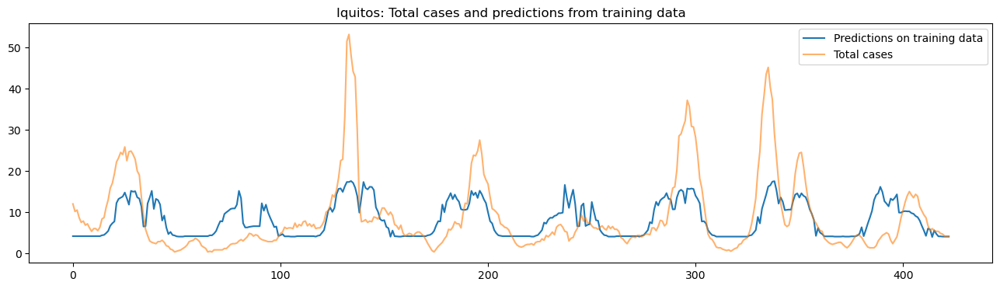

In [69]:
plt.figure(figsize=(16,4))
x = np.arange(preds_train_iq.shape[0])
plt.plot(x, preds_train_iq, label='Predictions on training data')
plt.plot(x, y_train_iq, label='Total cases', alpha=0.6)
plt.title('Iquitos: Total cases and predictions from training data')
plt.legend();

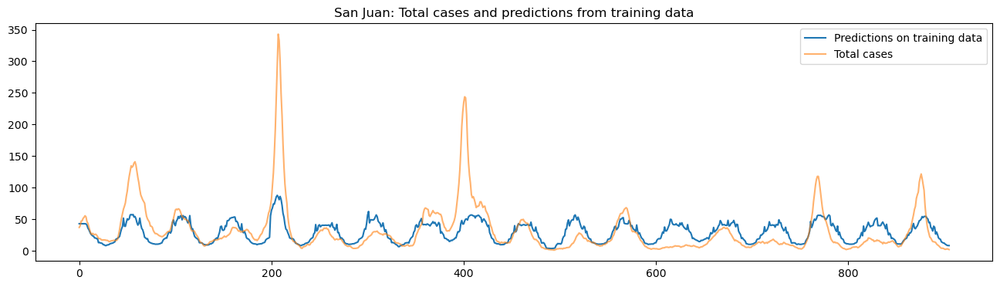

In [70]:
plt.figure(figsize=(16,4))
x = np.arange(preds_train_sj.shape[0])
plt.plot(x, preds_train_sj, label='Predictions on training data')
plt.plot(x, y_train_sj, label='Total cases', alpha=0.6)
plt.title('San Juan: Total cases and predictions from training data')
plt.legend();

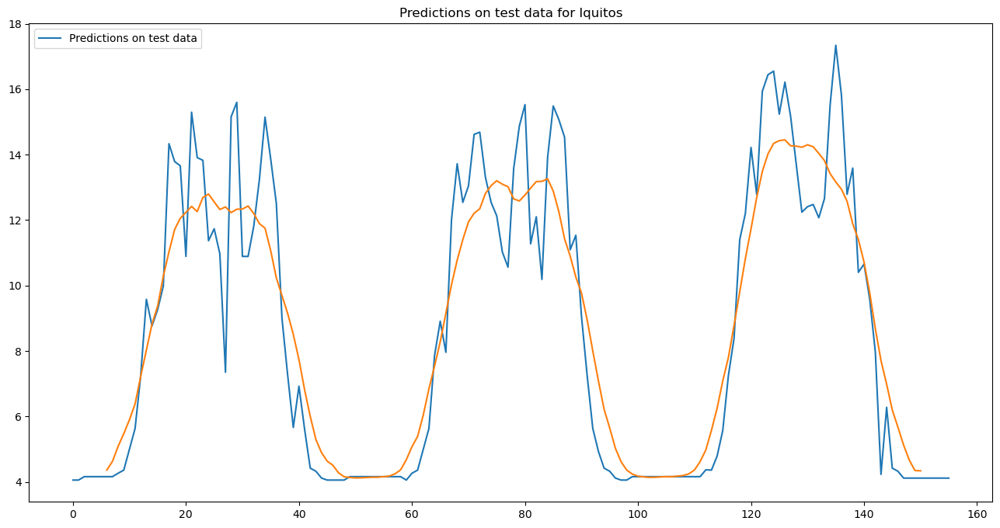

In [71]:
# Plot predictions on test data 
iq_preds_rolled = pd.Series(iq_preds).rolling(12, center=True).mean()
plt.figure(figsize=(16,8))
plt.plot(iq_preds, label='Predictions on test data')
plt.plot(iq_preds_rolled)
plt.title('Predictions on test data for Iquitos')
plt.legend()

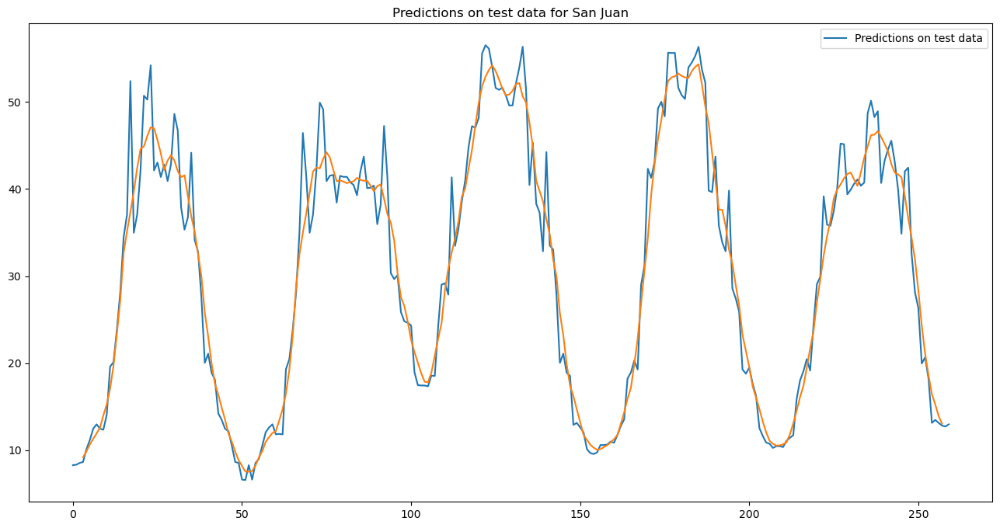

In [72]:
# Plot predictions on test data 
sj_preds_rolled = pd.Series(sj_preds).rolling(6, center=True).mean()
plt.figure(figsize=(16,8))
plt.plot(sj_preds, label='Predictions on test data')
plt.plot(sj_preds_rolled)
plt.title('Predictions on test data for San Juan')
plt.legend()

### Write final predictions to csv final for submission

In [73]:
print(iq_preds_rolled.mean()) 
print(sj_preds_rolled.mean()) 


8.888446820193323
30.927184442133687


In [74]:
iq_preds_rolled = iq_preds_rolled + 2
sj_preds_rolled = sj_preds_rolled + 3

In [75]:
print(iq_preds_rolled.mean())
print(sj_preds_rolled.mean())

10.888446820193323
33.92718444213368


In [76]:
iq_preds_rolled = iq_preds_rolled.fillna(method='bfill')
iq_preds_rolled = iq_preds_rolled.fillna(method='ffill')
sj_preds_rolled = sj_preds_rolled.fillna(method='bfill')
sj_preds_rolled = sj_preds_rolled.fillna(method='ffill')
# Using rolled for final submission
final_iq['total_cases'] = iq_preds_rolled.tolist()
final_sj['total_cases'] = sj_preds_rolled.tolist()
final = pd.concat([final_sj, final_iq], axis=0)
final['total_cases'] = final['total_cases'].astype(int)

In [77]:
# Write to file for submission 
print('Writing submission file to folder: ')
final.to_csv('submission_XGB_May_9.csv', index=False)

Writing submission file to folder: 


## FINAL SUBMISSION SCORE for MAE:  **24.2**

## How to improve from here
- More feature engineering
- Different models (such as LSTM neural network)